# Example of FORWARD performance over multiple networks

Below we can see FORWARD algorithm applied to mutiple networks. It demonstrates FOWARD capacity to scale and efficiently solve each network independnetly on their size or configuration.

In [4]:
include("../forward/Forward.jl")
include("../forward/Auxiliary.jl")
include("GraphInit.jl")
using .Forward
using .Auxiliary
using .GraphInit
using Graphs
using MetaGraphs
using GraphPlot
using Plots
using JuMP
using Ipopt
using Combinatorics
using PowerModelsDistribution
const _PMD = PowerModelsDistribution
using GraphRecipes, Plots

# IEEE 11

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'lanl11.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 56 in 'lanl11.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 58 in 'lanl11.dss' is not supported, skipping.
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting t

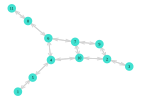

In [12]:
G = GraphInit.dc_graph_initialization("datasets/lanl11/lanl11.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        6
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        5
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        4

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9160000e+07 9.90e-07 3.64e+01

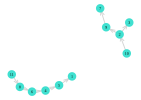

In [13]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 18

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee18.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 80 in 'ieee18.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 82 in 'ieee18.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


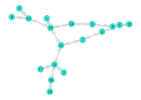

In [14]:
G = GraphInit.dc_graph_initialization("datasets/ieee18/ieee18.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:       12
Number of nonzeros in inequality constraint Jacobian.:       20
Number of nonzeros in Lagrangian Hessian.............:       39

Total number of variables............................:        6
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        3
Total number of inequality constraints...............:        7
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        2
        inequality constraints with only upper bounds:        4

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.9851090e+06 9.90e-07 1.00e+02

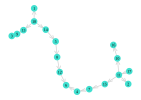

In [15]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 33

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee33.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 137 in 'ieee33.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


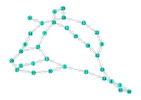

In [16]:
G = GraphInit.dc_graph_initialization("datasets/ieee33/ieee33.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        9
Number of nonzeros in Lagrangian Hessian.............:        6

Total number of variables............................:        3
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        7
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        6

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.2118209e+07 9.90e-07 4.65e+01

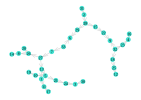

In [17]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 37

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee37.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 144 in 'ieee37.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


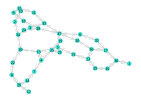

In [2]:
G = GraphInit.dc_graph_initialization("datasets/ieee37/ieee37.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      132
Number of nonzeros in inequality constraint Jacobian.:      162
Number of nonzeros in Lagrangian Hessian.............:     1782

Total number of variables............................:       44
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints................

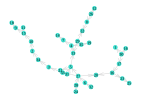

In [3]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 70

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee70.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 233 in 'ieee70.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 234 in 'ieee70.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


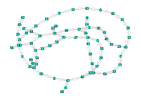

In [4]:
G = GraphInit.dc_graph_initialization("datasets/ieee70/ieee70.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        9
Number of nonzeros in Lagrangian Hessian.............:        6

Total number of variables............................:        3
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        7
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        6

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1532816e+05 9.90e-07 5.05e+01

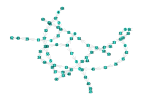

In [5]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 84

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee84.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 305 in 'ieee84.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 306 in 'ieee84.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


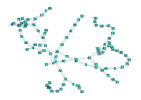

In [6]:
G = GraphInit.dc_graph_initialization("datasets/ieee84/ieee84.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:       22
Number of nonzeros in inequality constraint Jacobian.:       77
Number of nonzeros in Lagrangian Hessian.............:      385

Total number of variables............................:       22
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:       34
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:       11
        inequality constraints with only upper bounds:       22

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0535501e+05 9.90e-07 1.00e+02

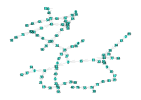

In [7]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 136

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee136.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 460 in 'ieee136.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 461 in 'ieee136.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence


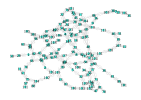

In [8]:
G = GraphInit.dc_graph_initialization("datasets/ieee136/ieee136.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:       18
Number of nonzeros in inequality constraint Jacobian.:       55
Number of nonzeros in Lagrangian Hessian.............:      208

Total number of variables............................:       16
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        3
Total number of inequality constraints...............:       24
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        7
        inequality constraints with only upper bounds:       16

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.6225760e+06 1.00e+00 1.00e+02

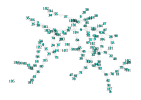

In [9]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# IEEE 8500

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'ieee8500.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 7666 in 'ieee8500.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 7667 in 'ieee8500.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : basemva=100 is the default value, you may want to adjust sbase_default for better convergence
[ PowerModelsDistribution | Info ] : An inconsistent number of nodes was specified on 2482; |1.2|!=1.
[ PowerModelsDistribution | Info ] : An inconsistent number of nodes was specified on 386; |1.2|!=1.
[ PowerModelsDistribution | Info ] : An inconsistent number of nodes was specified on 2275; |1.2|!=1.
[ PowerModelsDistribution | Info ] : An inconsistent number of nodes was specified on 2522; |1.2|!=1.
[ PowerModelsDistribution | Info ] : An inconsistent number of nodes was specified on 2275; |1.2|!=1.
[ PowerModelsDistrib

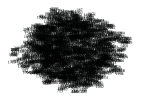

In [5]:
G = GraphInit.dc_graph_initialization("datasets/ieee8500/ieee8500.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:    32400
Number of nonzeros in inequality constraint Jacobian.:     5322
Number of nonzeros in Lagrangian Hessian.............:  1802925

Total number of variables............................:     1350
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      300
Total number of inequality constraints...............:     1381
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:     1272
        inequality constraints with only upper bounds:      108

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.7453441e+07 9.90e-07 1.00e+02

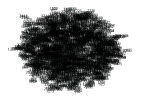

In [6]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# WS 120

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'lanl120.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 716 in 'lanl120.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 717 in 'lanl120.dss' is not supported, skipping.
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, default

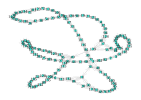

In [18]:
G = GraphInit.dc_graph_initialization("datasets/lanl120/lanl120.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:       60
Number of nonzeros in Lagrangian Hessian.............:      210

Total number of variables............................:       20
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:       41
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:       40

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.3199071e+09 9.90e-07 8.78e+01

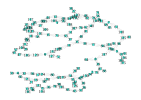

In [19]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# WS 240

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'lanl240.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 1291 in 'lanl240.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 1292 in 'lanl240.dss' is not supported, skipping.
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defau

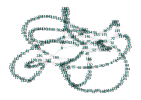

In [20]:
G = GraphInit.dc_graph_initialization("datasets/lanl240/lanl240.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:       45
Number of nonzeros in Lagrangian Hessian.............:      120

Total number of variables............................:       15
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:       31
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:       30

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.7317770e+10 9.90e-07 8.42e+01

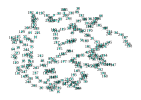

In [21]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)

# WS 400

[ PowerModelsDistribution | Info ] : Circuit has been reset with the 'clear' on line 1 in 'lanl400.dss'
[ PowerModelsDistribution | Info ] : Command 'calcvoltagebases' on line 2116 in 'lanl400.dss' is not supported, skipping.
[ PowerModelsDistribution | Info ] : Command 'solve' on line 2117 in 'lanl400.dss' is not supported, skipping.
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defaulting to WYE
└ @ PowerModelsDistribution ~/.julia/packages/PowerModelsDistribution/p4tGd/src/data_model/base/parse.jl:32
┌ PowerModelsDistribution | Warning ] : Unsupported connection power, defau

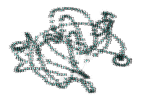

In [22]:
G = GraphInit.dc_graph_initialization("datasets/lanl400/lanl400.dss")
id_list = [get_prop(G, i, :id) for i in 1:nv(G)]
gplot(G, nodelabel=id_list)

Running Forward...
PreProcessor applied!
This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:       60
Number of nonzeros in Lagrangian Hessian.............:      210

Total number of variables............................:       20
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:       41
        inequality constraints with only lower bounds:        1
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:       40

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.5455946e+10 9.90e-07 1.77e+02

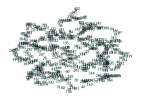

In [23]:
outlev = 2
@time begin
S, term_status, f_S = Forward.forward(G,Ipopt.Optimizer,"greedy_max",outlev)
end
# Plot pre-processed G
println("The cost is ",sum(f_S))
id_list = [get_prop(S, i, :id) for i in 1:nv(S)]
gplot(S, nodelabel=id_list)